In [1]:
%load_ext autoreload
%autoreload 2

## Basic setup

In [2]:
import Concord as ccd
import scanpy as sc
import torch
import warnings
from pathlib import Path
warnings.filterwarnings('ignore')

data_dir = Path('../data/Shichen_immune/')
data_path = data_dir / "adata_Nov21-1754.h5ad"
adata_sc = sc.read(
    data_path
)


In [3]:
adata_t10 = sc.read('../data/QZ_Immune/concord_t_int10_post2_final_cleaned_singlet_processed.h5ad')

In [8]:
adata_sc.obs['dataset'] = 'Thomson_exhaust'

In [7]:
adata_t10.obs['dataset'].value_counts()

dataset
23DEC_cytokine    45371
drug3             43769
drug2             42414
tc_30hr           28109
cite1             22682
sisi_cytokine     18857
23DEC_PNEC        14937
CTQZ01            14568
screen1           13956
t_exhaust8D        4341
Name: count, dtype: int64

In [ ]:
# Combined adata_sc and adata_t10
adata = adata_t10.concatenate(adata_sc)

In [ ]:
adata.write_h5ad('../data/adata_combined.h5ad')

In [11]:
import time
from pathlib import Path
proj_name = "concord_t10_plus_Texaust"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
file_suffix = f"{time.strftime('%b%d-%H%M')}"
seed = 0

In [12]:
file_suffix

'Nov21-1824'

In [13]:
adata.shape

(265924, 23328)

## Run Concord

In [ ]:
file_suffix = f"{time.strftime('%b%d-%H%M')}"
output_key = f'Concord_{file_suffix}'
feature_list = ccd.ul.select_features(adata, n_top_features=10000, flavor='seurat_v3')
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=feature_list, 
                      domain_key='dataset',
                      batch_size=256, 
                      latent_dim=64,
                      n_epochs=20,
                      augmentation_mask_prob = 0.5, 
                      clr_temperature = .3, # Check out advanced usage to learn what this parameter controls
                      use_decoder=False,
                      seed=seed, 
                      inplace=False, 
                      verbose=False, 
                      device=device,
                      save_dir=save_dir) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
cur_ccd.encode_adata(input_layer_key='X_log1p', output_key=output_key)

# Save the latent embedding to a filem, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")
adata.obsm = cur_ccd.adata.obsm # If not inplace

Concord.utils.feature_selector - WARNING - The number of cells for VEG selection (265924) exceeds the limit of 100,000. Downsampling cells to 50,000 for VEG selection.Note you can set subsample_frac to a value between 0 and 1 to control the number of cells.
Concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
Concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.


: 

## Visualize Concord latent with UMAP

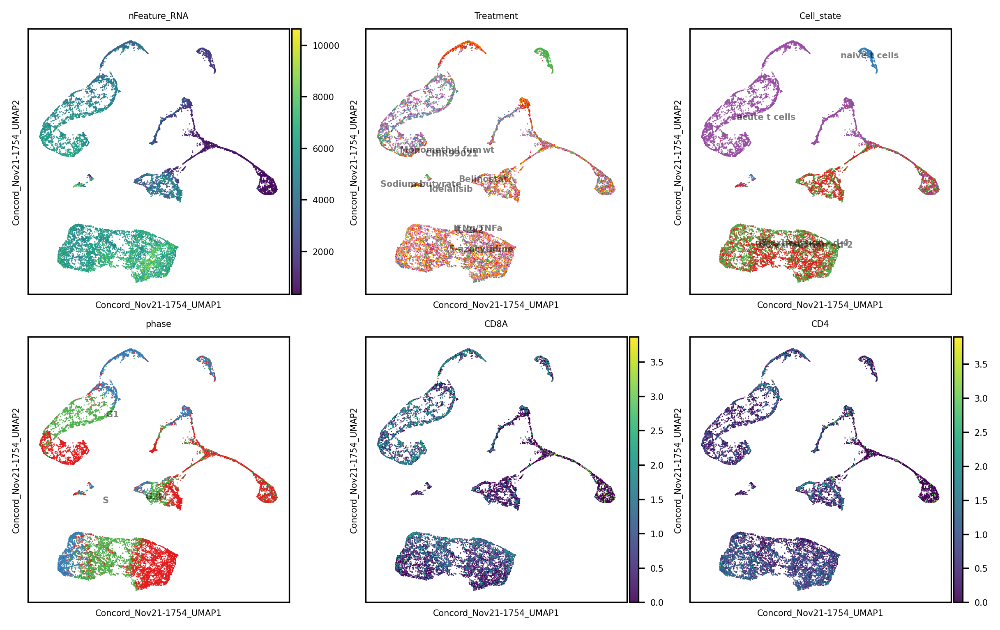

In [56]:
basis= output_key
ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = basis + '_UMAP'
show_cols = ['nFeature_RNA', 'Treatment', 'Cell_state',	'phase', 'CD8A', 'CD4']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(8,5), dpi=300, ncols=3, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [57]:
ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)

In [58]:
show_basis = f'{basis}_UMAP_3D'
for col in show_cols:
    ccd.pl.plot_embedding_3d(
        adata, basis=show_basis, color_by=col,
        save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
        point_size=1, opacity=0.8, width=1500, height=1000
    )

ValueError: Value of 'color' is not the name of a column in 'data_frame'. Expected one of ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Assignment', 'Treatment', 'Cell_state', 'S_score', 'G2M_score', 'phase', 'DIM1', 'DIM2', 'DIM3'] but received: CD8A

In [31]:
ccd.ul.anndata_to_viscello(adata, data_dir / f"cello_{proj_name}_{file_suffix}", project_name = proj_name, organism='hsa')

VisCello project created at ../data/Shichen_immune/cello_concord_Shichen_immune_Nov21-1457
